# Imports

In [109]:
import torch
import torchvision.io
import os
import shutil
import numpy as np
import pandas as pd
import contextlib
import io
from pathlib import Path
from scipy.special import softmax
import json
import matplotlib.pyplot as plt

from torchvision import transforms
import transformers
from transformers import AutoTokenizer, TrainingArguments, Trainer, AutoModelForSequenceClassification
import datasets

import matplotlib.pyplot as plt

from tqdm import tqdm

# Getting started:

- Use the Google Vision Transformer to take in a subset of the CheXpert training data 
- Get .jpg images into the correct format for the model to work
- Get multi-class multi-label labels into the correct format
- See if we can get model to start training

<hr>

# Data

In [2]:
file_path = '../Data/train_data_subset'

files = os.listdir(file_path)

In [3]:
files = sorted(files, key=lambda x: int(x.split('_')[1].split('.')[0]))

In [4]:
df = pd.read_csv('../Data/train2023.csv')

In [5]:
df

,Unnamed: 0.1,Unnamed: 0,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Pneumonia,Pleural Effusion,Pleural Other,Fracture,Support Devices
0,0,0,train/pid50512/study1/view1_frontal.jpg,Female,68,Frontal,AP,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
1,1,1,train/pid21580/study2/view1_frontal.jpg,Female,87,Frontal,AP,NaN,NaN,0.0,1.0,NaN,0.0,NaN,1.0,NaN
2,2,2,train/pid21580/study1/view1_frontal.jpg,Female,83,Frontal,AP,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN
3,3,3,train/pid21580/study1/view2_lateral.jpg,Female,83,Lateral,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN
4,4,4,train/pid33839/study1/view1_frontal.jpg,Male,41,Frontal,AP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178153,178153,223409,train/pid16708/study2/view1_frontal.jpg,Male,59,Frontal,AP,NaN,NaN,NaN,0.0,NaN,1.0,NaN,NaN,NaN
178154,178154,223410,train/pid16708/study1/view1_frontal.jpg,Male,59,Frontal,AP,NaN,NaN,NaN,0.0,-1.0,0.0,NaN,NaN,NaN
178155,178155,223411,train/pid32381/study1/view1_frontal.jpg,Female,0,Frontal,AP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
178156,178156,223412,train/pid25865/study1/view1_frontal.jpg,Female,0,Frontal,AP,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN,-1.0


In [6]:
df_subset = df[::1000]

In [7]:
df_subset

,Unnamed: 0.1,Unnamed: 0,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Pneumonia,Pleural Effusion,Pleural Other,Fracture,Support Devices
0,0,0,train/pid50512/study1/view1_frontal.jpg,Female,68,Frontal,AP,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
1000,1000,1172,train/pid29112/study1/view2_lateral.jpg,Male,68,Lateral,NaN,1.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1.0
2000,2000,2457,train/pid01032/study2/view1_frontal.jpg,Female,71,Frontal,PA,1.0,NaN,NaN,NaN,NaN,-1.0,NaN,NaN,NaN
3000,3000,3744,train/pid22981/study1/view1_frontal.jpg,Female,54,Frontal,AP,1.0,-1.0,NaN,-1.0,NaN,-1.0,NaN,NaN,NaN
4000,4000,4954,train/pid50403/study2/view1_frontal.jpg,Male,22,Frontal,AP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
174000,174000,218286,train/pid13224/study3/view1_frontal.jpg,Male,79,Frontal,AP,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
175000,175000,219503,train/pid23285/study1/view1_lateral.jpg,Male,76,Lateral,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
176000,176000,220756,train/pid20230/study1/view1_frontal.jpg,Male,25,Frontal,AP,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN
177000,177000,221973,train/pid20342/study2/view1_frontal.jpg,Male,59,Frontal,AP,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,1.0


In [8]:
df_subset = df_subset.fillna(0)
df_subset

,Unnamed: 0.1,Unnamed: 0,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Pneumonia,Pleural Effusion,Pleural Other,Fracture,Support Devices
0,0,0,train/pid50512/study1/view1_frontal.jpg,Female,68,Frontal,AP,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1000,1000,1172,train/pid29112/study1/view2_lateral.jpg,Male,68,Lateral,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2000,2000,2457,train/pid01032/study2/view1_frontal.jpg,Female,71,Frontal,PA,1.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0
3000,3000,3744,train/pid22981/study1/view1_frontal.jpg,Female,54,Frontal,AP,1.0,-1.0,0.0,-1.0,0.0,-1.0,0.0,0.0,0.0
4000,4000,4954,train/pid50403/study2/view1_frontal.jpg,Male,22,Frontal,AP,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
174000,174000,218286,train/pid13224/study3/view1_frontal.jpg,Male,79,Frontal,AP,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
175000,175000,219503,train/pid23285/study1/view1_lateral.jpg,Male,76,Lateral,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
176000,176000,220756,train/pid20230/study1/view1_frontal.jpg,Male,25,Frontal,AP,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
177000,177000,221973,train/pid20342/study2/view1_frontal.jpg,Male,59,Frontal,AP,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0


In [9]:
np.array(files)

array(['image_0.jpg', 'image_1.jpg', 'image_2.jpg', 'image_3.jpg',
       'image_4.jpg', 'image_5.jpg', 'image_6.jpg', 'image_7.jpg',
       'image_8.jpg', 'image_9.jpg', 'image_10.jpg', 'image_11.jpg',
       'image_12.jpg', 'image_13.jpg', 'image_14.jpg', 'image_15.jpg',
       'image_16.jpg', 'image_17.jpg', 'image_18.jpg', 'image_19.jpg',
       'image_20.jpg', 'image_21.jpg', 'image_22.jpg', 'image_23.jpg',
       'image_24.jpg', 'image_25.jpg', 'image_26.jpg', 'image_27.jpg',
       'image_28.jpg', 'image_29.jpg', 'image_30.jpg', 'image_31.jpg',
       'image_32.jpg', 'image_33.jpg', 'image_34.jpg', 'image_35.jpg',
       'image_36.jpg', 'image_37.jpg', 'image_38.jpg', 'image_39.jpg',
       'image_40.jpg', 'image_41.jpg', 'image_42.jpg', 'image_43.jpg',
       'image_44.jpg', 'image_45.jpg', 'image_46.jpg', 'image_47.jpg',
       'image_48.jpg', 'image_49.jpg', 'image_50.jpg', 'image_51.jpg',
       'image_52.jpg', 'image_53.jpg', 'image_54.jpg', 'image_55.jpg',
       'image_56

In [10]:
sorted(df_subset.columns)

['AP/PA',
 'Age',
 'Cardiomegaly',
 'Enlarged Cardiomediastinum',
 'Fracture',
 'Frontal/Lateral',
 'Lung Opacity',
 'No Finding',
 'Path',
 'Pleural Effusion',
 'Pleural Other',
 'Pneumonia',
 'Sex',
 'Support Devices',
 'Unnamed: 0',
 'Unnamed: 0.1']

Get the classes we care about for making predictions about

<div class = 'alert alert-info'>

### ALPHABETICAL ORDER!

In [71]:
classes = [
    'Cardiomegaly',
    'Enlarged Cardiomediastinum',
    'Fracture',
    'Lung Opacity',
    'No Finding',
    'Pleural Effusion',
    'Pleural Other',
    'Pneumonia',
    'Support Devices',
]

In [72]:
len(classes)

9

In [73]:
labels = df_subset[classes].values

In [74]:
labels.shape

(179, 9)

In [75]:
def N_hot_encode(array, column_shape):
  
  vectors = []

  for row in array:
    row1 = np.zeros(column_shape)
    row2 = np.zeros(column_shape)
    row3 = np.zeros(column_shape)

    for i, label in enumerate(row):
      if label == 1:
        row1[i] += 1
      
      if label == 0:
        row2[i] += 1
      
      if label == -1:
        row3[i] += 1

    N_hot_vec = np.vstack((row1,row2,row3))
    vectors.append(N_hot_vec)

  return np.array(vectors)

In [76]:
N_hot_encode(labels, labels.shape[1]).shape

(179, 3, 9)

In [77]:
ids = [f'Patient_{i}' for i in range(len(df_subset))]

In [78]:
N_hot_labels = N_hot_encode(labels, labels.shape[1])

In [79]:
N_hot_labels[0]

array([[0., 0., 0., 0., 1., 0., 0., 0., 1.],
       [1., 1., 1., 1., 0., 1., 1., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.]])

In [80]:
labels[0]

array([0., 0., 0., 0., 1., 0., 0., 0., 1.])

Don't get tripped up... the array below is from the original data frame. The N hot encoded labels are endcoded from the `labels` array you made which is based upon the `classes` list, which are the alphebetized class names.

In [81]:
df_subset.iloc[0].values[-9:]

array([1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0], dtype=object)

In [25]:
torchvision.io.read_image?

Signature:
torchvision.io.read_image(
    path: str,
    mode: torchvision.io.image.ImageReadMode = <ImageReadMode.UNCHANGED: 0>,
) -> torch.Tensor
Docstring:
Reads a JPEG or PNG image into a 3 dimensional RGB or grayscale Tensor.
Optionally converts the image to the desired format.
The values of the output tensor are uint8 in [0, 255].

Args:
    path (str): path of the JPEG or PNG image.
    mode (ImageReadMode): the read mode used for optionally converting the image.
        Default: ``ImageReadMode.UNCHANGED``.
        See ``ImageReadMode`` class for more information on various
        available modes.

Returns:
    output (Tensor[image_channels, image_height, image_width])
File:      ~/.local/lib/python3.11/site-packages/torchvision/io/image.py
Type:      function

In [26]:
files = ['../Data/train_data_subset/' + file for file in files]

In [27]:
files[0]

'../Data/train_data_subset/image_0.jpg'

In [28]:
torchvision.io.read_image(files[0], mode = torchvision.io.image.ImageReadMode.RGB)

tensor([[[  1,   1,   1,  ...,   0,   0,   0],
         [  0,   0,   0,  ...,   0,   0,   0],
         [  1,   1,   1,  ...,   1,   1,   1],
         ...,
         [172, 158, 152,  ..., 233, 200, 242],
         [163, 160, 137,  ..., 239, 231, 255],
         [175, 162, 130,  ..., 207, 205, 255]],

        [[  1,   1,   1,  ...,   0,   0,   0],
         [  0,   0,   0,  ...,   0,   0,   0],
         [  1,   1,   1,  ...,   1,   1,   1],
         ...,
         [172, 158, 152,  ..., 233, 200, 242],
         [163, 160, 137,  ..., 239, 231, 255],
         [175, 162, 130,  ..., 207, 205, 255]],

        [[  1,   1,   1,  ...,   0,   0,   0],
         [  0,   0,   0,  ...,   0,   0,   0],
         [  1,   1,   1,  ...,   1,   1,   1],
         ...,
         [172, 158, 152,  ..., 233, 200, 242],
         [163, 160, 137,  ..., 239, 231, 255],
         [175, 162, 130,  ..., 207, 205, 255]]], dtype=torch.uint8)

In [29]:
files[0]

'../Data/train_data_subset/image_0.jpg'

In [30]:
torchvision.io.read_image(files[0])

tensor([[[  1,   1,   1,  ...,   0,   0,   0],
         [  0,   0,   0,  ...,   0,   0,   0],
         [  1,   1,   1,  ...,   1,   1,   1],
         ...,
         [172, 158, 152,  ..., 233, 200, 242],
         [163, 160, 137,  ..., 239, 231, 255],
         [175, 162, 130,  ..., 207, 205, 255]]], dtype=torch.uint8)

In [32]:
# torchvision.io.image.ImageReadMode.RGB

Plot the first channel

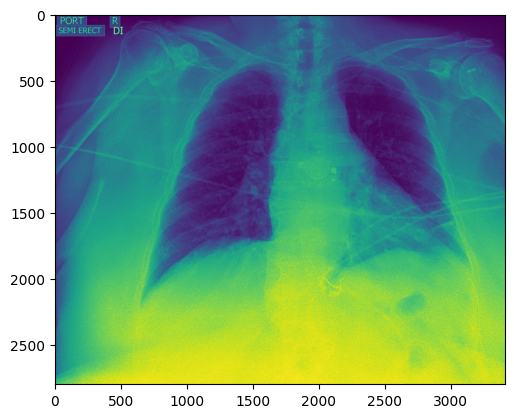

In [34]:
plt.imshow(
    torchvision.io.read_image(files[0], mode=torchvision.io.image.ImageReadMode.RGB)[0]
    )

Note that plotting the gray scale image will also be in 'color' with plt.imshow. I guess the defaul behavior is a heat map of RGB values.

However, the model expects inputs with 3 channels.

<hr>

# Data formatting

### Model

In [35]:
model_name_or_path = "google/vit-base-patch16-224-in21k"

In [36]:
feature_extractor = transformers.AutoFeatureExtractor.from_pretrained(
    model_name_or_path
)

2024-04-17 06:32:46.442521: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-17 06:32:46.442622: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-17 06:32:46.496382: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-17 06:32:46.645997: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-17 06:32:48.272912: W tensorflow/compiler/tf2

<div class = 'alert alert-warning'>

This is a TensorFlow model. Change data inputs as needed.

### Transforms

The model requires that you have images in the `RGB` channel (recreate the image tensor 2 times and stack the tensors into a 3 channel tensor), resized to 224x224, put into the correct floating point dtype, and normalized (feature mean and standard deviation need to be .5 for all channels).

**NOTE:**

You are doing all these manipulations in PyTorch tensors. The model might only accept TensorFlow tensors. If this is the case you will have to convert to numpy then into TensorFlow tensors. We will see if you get an error having to do with PyTorch when implementing the model, but it is possible.

If you need to convert tensors to tensorflow objects, use the following pipeline:


-  `np_tensor = torch_tensors.numpy()`
- `tf_tensor = tf.convert_to_tensor(np_tensor)`

#### Example: Let's convert the image_0.jpg to a tensor and perform the transforms

In [37]:
x = torchvision.io.read_image(
    files[0], 
    mode = torchvision.io.image.ImageReadMode.RGB
    )

In [38]:
x.shape

torch.Size([3, 2800, 3408])

Every channel is identical, but the model expects three channels.

Define the transforms

In [49]:
class ViT_Transforms():

    """
    Convert a .jpg image into a Tensor using PyTorch, implementing the necessary 
    transforms that the model excpects from its input. This includes:

    - Resizing to 224x224
    - Converting to RGB channels (from grayscale)
    - Converting the dtype to float.16

    To use this data class, need to define the resizer, dtyper, and normalizer
    classes, instantiating them with the pretrained model parameters.

    ------------------------------------------------------------------------------

    Args:
    _____
    
    - input_jpg: str
        File path to .jpg image that you want to transform.

    Output:
    _______

    - tensor: tensor
        PyTorch tensor with float.16 inputs, with each output image tensor 
        having the shape (3, 224, 224).
    """

    # The arguments here are themselves classes, instantiate as a variable
    def __init__(self, resizer, dtyper, normalizer):
        self.resizer = resizer
        self.dtyper = dtyper
        self.normalizer = normalizer

    def get_tensor(self, input_jpg):

        tensor = torchvision.io.read_image(
            input_jpg, 
            mode = torchvision.io.image.ImageReadMode.RGB
            )
        tensor = self.resizer(tensor)
        tensor = self.dtyper(tensor)
        tensor = self.normalizer(tensor)

        return tensor

In [50]:
resizer = transforms.Resize(
    (feature_extractor.size['height'], feature_extractor.size['width'])
    )

dtyper = transforms.ConvertImageDtype(dtype=torch.float16)

normalizer = transforms.Normalize(
    mean=feature_extractor.image_mean, 
    std=feature_extractor.image_std
    )

In [52]:
t = ViT_Transforms(resizer, dtyper, normalizer)

In [44]:
files[0]

'../Data/train_data_subset/image_0.jpg'

Supply the image path as the argument corresponding to `input_jpg`

In [45]:
transformed_x = t.get_tensor(files[0])

/home/paperspace/.local/lib/python3.11/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [47]:
transformed_x.shape

torch.Size([3, 224, 224])

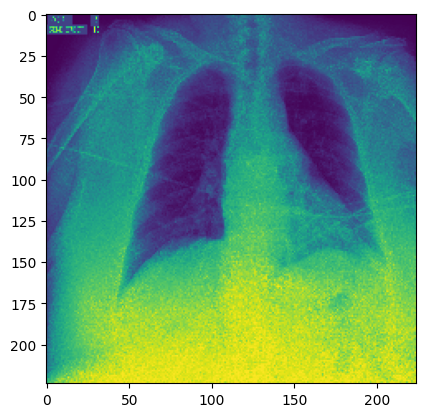

In [48]:
plt.imshow(transformed_x[0])

<div class = 'alert alert-info'>

**<u>NOTE:</u>** 

There are ways to have the model accept images of greater resolution than 224x224, which may increase model performance.

As a first pass, use this methodology to transform the data and pass into the model.

For future implementations, look into the [API on `ViTForMaskedImageModeling`](https://huggingface.co/docs/transformers/en/model_doc/vit).

```
"Note that it’s possible to fine-tune ViT on higher resolution images than the ones it has been trained on, by setting interpolate_pos_encoding to True in the forward of the model. This will interpolate the pre-trained position embeddings to the higher resolution."
```

Also, an interesting question is whether you can use the picel values as tokens and input into an NLP and see how well it performs - maybe Llama7B since you have used it already?

<hr>

Let's see how well the transforms function can parse the subset of data (179 images, 1000th of the entire data (.1%))

In [56]:
transformed_inputs = [
    t.get_tensor(file) for file in files
]

/home/paperspace/.local/lib/python3.11/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Progress:   0%|          | 0/3 [01:40<?, ?it/s]


In [57]:
transformed_inputs = []

for file in tqdm(files, desc='Progress'):
    transformed_inputs.append(t.get_tensor(file))   

Progress:   0%|          | 0/179 [00:00<?, ?it/s]/home/paperspace/.local/lib/python3.11/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
Progress: 100%|██████████| 179/179 [00:07<00:00, 22.52it/s]


In [58]:
np.array(transformed_inputs).shape

(179, 3, 224, 224)

[[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 1. 1. 1. 1. 1. 1. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1.]] 

[ 0.  0.  0.  0.  0.  0.  0.  0. -1.] 

['Cardiomegaly' 'Enlarged Cardiomediastinum' 'Fracture' 'Lung Opacity'
 'No Finding' 'Pleural Effusion' 'Pleural Other' 'Pneumonia'
 'Support Devices']


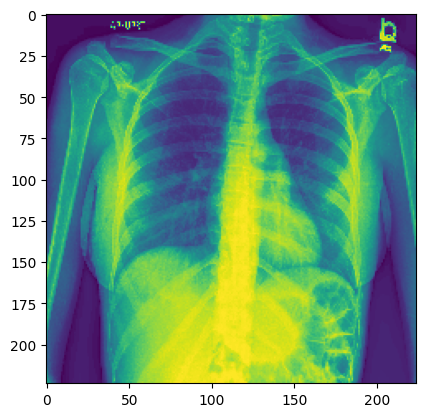

In [83]:
rand_ind = np.random.choice(179)

print(N_hot_labels[rand_ind], '\n')
print(labels[rand_ind], '\n')
print(np.array(classes))

plt.imshow(transformed_inputs[rand_ind][0])

Since `No Finding` and `Pneumonia` are zero here, I am assuming they weren't tested for and were `Nan`s in the original df.

In [84]:
rand_ind

81

To find the person, use the rand_ind and multiply by 1000 to get the correct index from the original data frame

In [91]:
df.loc[[81000]]

,Unnamed: 0.1,Unnamed: 0,Path,Sex,Age,Frontal/Lateral,AP/PA,No Finding,Enlarged Cardiomediastinum,Cardiomegaly,Lung Opacity,Pneumonia,Pleural Effusion,Pleural Other,Fracture,Support Devices
81000,81000,101540,train/pid05239/study3/view1_frontal.jpg,Female,24,Frontal,AP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0


Yep! Everything `Nan` except for `Support Devices` which is set to `-1`, which is represented in the labels

In [105]:
print(
    'Estimated time to transform the train data using the above method:\n',
    f'1 hour, {60*(7000/60/60 % 1):.2f} minutes'
    )

Estimated time to transform the train data using the above method:
 1 hour, 56.67 minutes


# Load the model

In [106]:
model_name_or_path

'google/vit-base-patch16-224-in21k'

In [107]:
len(classes)

9

In [108]:
model = transformers.AutoModelForImageClassification.from_pretrained(
    model_name_or_path, num_labels=len(classes)
)

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [110]:
training_args = TrainingArguments(
    output_dir="../Models/google_vit_testrun",
    overwrite_output_dir=False,
    per_device_train_batch_size=1,
    per_device_eval_batch_size=1,
    dataloader_num_workers=8,
    dataloader_drop_last=True,
    num_train_epochs=3,
    seed=1337,
    logging_steps=50,
    save_steps=1000,
    remove_unused_columns=False,
    warmup_ratio=0.25,
    lr_scheduler_type="cosine",
    learning_rate=2e-4,
    ignore_data_skip=True,
    report_to="none",
)

In [111]:
metric_auc = datasets.load_metric("roc_auc", "multilabel")


def compute_metrics(p):
    preds = np.argmax(p.predictions, axis=1)

    pred_scores = softmax(p.predictions.astype("float32"), axis=1)
    auc = metric_auc.compute(
        prediction_scores=pred_scores, references=p.label_ids, multi_class="ovo"
    )["roc_auc"]
    return {"roc_auc": auc}

/tmp/ipykernel_4404/426453883.py:1: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  metric_auc = datasets.load_metric("roc_auc", "multilabel")


Need to load in an Arrow `Dataset`. I think the keys are `pixel_values` and `label`

<div class = 'alert alert-danger'>

### GET PIXELS INTO TENSORS!

In [155]:
transformed_inputs[0]

tensor([[[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
         [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
         [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],

        [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
         [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
         [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],

        [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1

In [157]:
torch.stack([tensor for tensor in transformed_inputs]).shape

torch.Size([179, 3, 224, 224])

In [167]:
# Stack the list of tensors into a single tensor
stacked_pixel_values = torch.stack([tensor for tensor in transformed_inputs])

In [170]:
stacked_pixel_values[0][0]

tensor([[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
        [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
        [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
        ...,
        [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
        [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
        [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],
       dtype=torch.float16)

In [171]:
# Create the dataset with stacked tensor pixel values and labels
data = {
    'pixel_values': stacked_pixel_values,
    'labels': N_hot_labels,
}

In [172]:
data['pixel_values'][0]

tensor([[[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
         [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
         [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],

        [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
         [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
         [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],

        [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1

In [180]:
data

{'pixel_values': tensor([[[[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
           [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
           [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
           ...,
           [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
           [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
           [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],
 
          [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
           [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
           [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
           ...,
           [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
           [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
           [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],
 
          [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000

<div class = 'alert alert-danger'>

### THE PROBLEM:

Converting the data dictionary into a `Dataset` object converts the torch tensors to lists.

In [173]:
data_set = datasets.Dataset.from_dict(
    data
)

In [183]:
data_set[0]['pixel_values']

[[[-0.9844,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -1.0,
   -1.0,
   -1.0,
   -1.0,
   -1.0,
   -0.992,
   -1.0,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.608,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.992,
   -0.992,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9766,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9766,
   -0.9844,
   -0.9688,
   -0.9844,
   -0.9766,
   -0.9688,
   -0.9688,
   -0.9688,
   -0.9688,
   -0.953,
   -0.9688,
   -0.953,
   -0.953,
   -0.9453,
   -0.9136,
   -0.9375,
   -0.898,
   -0.8745,
   -0.8823,
   -0.8745,
   -0.859,
   -0.8745,
   -0.859,
   -0.8667,
   -0.859,
   -0.8667,
   -0.851,
   -0.8667,
   -0.8193,
   -0.663

In [182]:
torch.tensor(data_set[0]['pixel_values'])

tensor([[[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
         [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
         [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],

        [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
         [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
         [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],

        [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1

In [174]:
train_dataset = data_set.select(np.arange(100))
val_dataset = data_set.select(np.arange(100, len(data_set), 1))

In [175]:
train_dataset

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 100
})

In [184]:
for i in range(len(train_dataset)):
    train_dataset[i]['pixel_values'] = torch.tensor(train_dataset[i]['pixel_values'])

In [185]:
train_dataset[0]['pixel_values']

[[[-0.9844,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -1.0,
   -1.0,
   -1.0,
   -1.0,
   -1.0,
   -0.992,
   -1.0,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.608,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.992,
   -0.992,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9766,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9766,
   -0.9844,
   -0.9688,
   -0.9844,
   -0.9766,
   -0.9688,
   -0.9688,
   -0.9688,
   -0.9688,
   -0.953,
   -0.9688,
   -0.953,
   -0.953,
   -0.9453,
   -0.9136,
   -0.9375,
   -0.898,
   -0.8745,
   -0.8823,
   -0.8745,
   -0.859,
   -0.8745,
   -0.859,
   -0.8667,
   -0.859,
   -0.8667,
   -0.851,
   -0.8667,
   -0.8193,
   -0.663

In [176]:
val_dataset

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 79
})

In [177]:
train_dataset[0]['pixel_values']

[[[-0.9844,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -1.0,
   -1.0,
   -1.0,
   -1.0,
   -1.0,
   -0.992,
   -1.0,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.608,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.992,
   -0.992,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9766,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9766,
   -0.9844,
   -0.9688,
   -0.9844,
   -0.9766,
   -0.9688,
   -0.9688,
   -0.9688,
   -0.9688,
   -0.953,
   -0.9688,
   -0.953,
   -0.953,
   -0.9453,
   -0.9136,
   -0.9375,
   -0.898,
   -0.8745,
   -0.8823,
   -0.8745,
   -0.859,
   -0.8745,
   -0.859,
   -0.8667,
   -0.859,
   -0.8667,
   -0.851,
   -0.8667,
   -0.8193,
   -0.663

In [164]:
type(train_dataset[0]['pixel_values'])

list

In [165]:
type(train_dataset[0]['pixel_values'][0])

list

In [166]:
type(train_dataset[1]['pixel_values'])

list

In [212]:
def batch_sampler(examples):
    pixel_values = torch.stack([example["pixel_values"] for example in examples])
    labels = torch.tensor([example["labels"] for example in examples])
    return {"pixel_values": pixel_values, "labels": labels}

**I can't seem to get the Arrow Dataset object `pixel_values` to get converted to a tensor, so I will try and use the dictionary of data values instead and see if that works.**

In [186]:
data

{'pixel_values': tensor([[[[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
           [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
           [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
           ...,
           [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
           [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
           [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],
 
          [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
           [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
           [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
           ...,
           [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
           [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
           [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],
 
          [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000

In [187]:
train = {
    'pixel_values': data['pixel_values'][:100],
    'labels': data['labels'][:100],
}

val = {
    'pixel_values': data['pixel_values'][100:],
    'labels': data['labels'][100:],
}

In [190]:
trainer = Trainer(
    model=model,
    args=training_args,
    # train_dataset=train_dataset,
    # eval_dataset=val_dataset,
    train_dataset=train,
    eval_dataset=val,
    compute_metrics=compute_metrics,
    tokenizer=feature_extractor,
    # data_collator=batch_sampler,
)

Need to figure out how to input the labels and pixels correctly, and batch the data into the model in the correct format. Need to define the data_collator and ensure that the inputs play nicely with the expected format of the model.

In [191]:
train_results = trainer.train()

KeyError: Caught KeyError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/home/paperspace/.local/lib/python3.11/site-packages/torch/utils/data/_utils/worker.py", line 308, in _worker_loop
    data = fetcher.fetch(index)
           ^^^^^^^^^^^^^^^^^^^^
  File "/home/paperspace/.local/lib/python3.11/site-packages/torch/utils/data/_utils/fetch.py", line 51, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/paperspace/.local/lib/python3.11/site-packages/torch/utils/data/_utils/fetch.py", line 51, in <listcomp>
    data = [self.dataset[idx] for idx in possibly_batched_index]
            ~~~~~~~~~~~~^^^^^
KeyError: 1


We definitely need the collator function, and the data needs to be in a Dataset object. Look into how to make the Dataset object not overwrite your pixel values as a list from a tensor.

<hr>

### Looking into input data format

Can I use the dataset.load_dataset function to make my data dictionary an iterable, while keeping the dtype of the pixel_values and labels?

In [192]:
data

{'pixel_values': tensor([[[[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
           [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
           [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
           ...,
           [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
           [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
           [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],
 
          [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
           [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
           [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
           ...,
           [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
           [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
           [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],
 
          [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000

No, this expects a path to data files

In [194]:
# ds = datasets.load_dataset(
#     data
# )

Try out some built in functions from torch/Arrow

In [195]:
data_set

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 179
})

In [197]:
data_set[0]['pixel_values']

[[[-0.9844,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -1.0,
   -1.0,
   -1.0,
   -1.0,
   -1.0,
   -0.992,
   -1.0,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.608,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.6157,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.992,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.992,
   -0.992,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9766,
   -0.9844,
   -0.9844,
   -0.9844,
   -0.9766,
   -0.9844,
   -0.9688,
   -0.9844,
   -0.9766,
   -0.9688,
   -0.9688,
   -0.9688,
   -0.9688,
   -0.953,
   -0.9688,
   -0.953,
   -0.953,
   -0.9453,
   -0.9136,
   -0.9375,
   -0.898,
   -0.8745,
   -0.8823,
   -0.8745,
   -0.859,
   -0.8745,
   -0.859,
   -0.8667,
   -0.859,
   -0.8667,
   -0.851,
   -0.8667,
   -0.8193,
   -0.663

In [198]:
data_set[0]['labels']

[[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0],
 [1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]

This isn't behaving like expected...

In [202]:
data_set_tensors = data_set.set_format(type='torch', columns=['pixel_values', 'labels'])

In [204]:
data_set_tensors.format

AttributeError: 'NoneType' object has no attribute 'format'

In [200]:
data_set_tensors[0]['pixel_values']

TypeError: 'NoneType' object is not subscriptable

<hr>

In [ ]:
from datasets import load_dataset
from transformers import AutoTokenizer
ds = load_dataset("rotten_tomatoes", split="validation")
tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')
def encode(batch):
    return tokenizer(batch['text'], padding=True, truncation=True, return_tensors='pt')
ds.set_transform(encode)
ds[0]

In [206]:
ds = data_set

ds = ds.with_format(type='torch', columns = ['pixel_values', 'labels'])

ds

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 179
})

In [207]:
ds[0]['pixel_values']

tensor([[[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
         [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
         [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],

        [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
         [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
         [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],

        [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1

In [208]:
ds[0]['labels']

tensor([[0., 0., 0., 0., 1., 0., 0., 0., 1.],
        [1., 1., 1., 1., 0., 1., 1., 1., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0.]])

<div class = 'alert alert-success'>

# Yay!

The `with_format` function returns a new Dataset object with the values belonging to the specified keys in the `columns` kwarg being in the requested format.

<hr>

In [209]:
train_ds = ds.select(np.arange(100))

val_ds = ds.select(np.arange(100, len(ds), 1))

In [210]:
train_ds

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 100
})

In [211]:
train_ds[0]['pixel_values']

tensor([[[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
         [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
         [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],

        [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
         [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
         [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],

        [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1

In [ ]:
metric_auc = datasets.load_metric("roc_auc", "multilabel")


def compute_metrics(p):
    preds = np.argmax(p.predictions, axis=1)

    pred_scores = softmax(p.predictions.astype("float32"), axis=1)
    auc = metric_auc.compute(
        prediction_scores=pred_scores, references=p.label_ids, multi_class="ovo"
    )["roc_auc"]
    return {"roc_auc": auc}

In [213]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_ds,
    eval_dataset=val_ds,
    compute_metrics=compute_metrics,
    tokenizer=feature_extractor,
    data_collator=batch_sampler,
)

In [214]:
train_results = trainer.train()

ValueError: Caught ValueError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/home/paperspace/.local/lib/python3.11/site-packages/torch/utils/data/_utils/worker.py", line 308, in _worker_loop
    data = fetcher.fetch(index)
           ^^^^^^^^^^^^^^^^^^^^
  File "/home/paperspace/.local/lib/python3.11/site-packages/torch/utils/data/_utils/fetch.py", line 54, in fetch
    return self.collate_fn(data)
           ^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipykernel_4404/778557498.py", line 3, in batch_sampler
    labels = torch.tensor([example["labels"] for example in examples])
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
ValueError: only one element tensors can be converted to Python scalars


Retry, but with the labels being flattened. Right now they are in a 3x9 matrix.

Though maybe this isn't the issue and we should first try to just input the labels as a list instead of a torch tensor. Do this by leaving `'labels'` out of the `columns` kwarg in the `with_format` function.

In [215]:
labels

array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 1., 0., ..., 0., 0., 1.]])

In [216]:
r1 = np.zeros(3)
r2 = np.zeros(3)
r3 = np.zeros(3)

r = np.hstack((r1,r2,r3))
r

array([0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [217]:
def N_hot_encode_1D(array, column_shape):
  
  vectors = []

  for row in array:
    row1 = np.zeros(column_shape)
    row2 = np.zeros(column_shape)
    row3 = np.zeros(column_shape)

    for i, label in enumerate(row):
      if label == 1:
        row1[i] += 1
      
      if label == 0:
        row2[i] += 1
      
      if label == -1:
        row3[i] += 1

    # Convert to a 1-D array of length 27.
    # First 9 entries signify +1 labels
    # Second 9 entries signify 0 labels
    # Thirds 9 entries signify -1 labels

    N_hot_vec = np.hstack((row1,row2,row3))
    vectors.append(N_hot_vec)

  return np.array(vectors)

In [218]:
N_hot_1D_labels = N_hot_encode_1D(labels, 9)

In [220]:
N_hot_1D_labels[0]

array([0., 0., 0., 0., 1., 0., 0., 0., 1., 1., 1., 1., 1., 0., 1., 1., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

Change model to have 27 output heads?

In [253]:
model = transformers.AutoModelForImageClassification.from_pretrained(
    model_name_or_path, num_labels=len(classes)*3
)

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [223]:
stacked_pixel_values.shape

torch.Size([179, 3, 224, 224])

In [233]:
# Create the dataset with stacked tensor pixel values and labels
data_1D = {
    'pixel_values': stacked_pixel_values,
    'labels': N_hot_1D_labels,
}

In [234]:
ds_1D = datasets.Dataset.from_dict(
    data_1D
)

In [242]:
ds_1D = ds_1D.with_format(type='torch', columns = ['pixel_values'], output_all_columns=True) 
# ['pixel_values', 'labels'])

In [243]:
ds_1D

Dataset({
    features: ['pixel_values', 'labels'],
    num_rows: 179
})

In [244]:
ds_1D[0]['pixel_values']

tensor([[[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
         [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
         [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],

        [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
         [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
         ...,
         [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
         [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
         [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],

        [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
         [-0.9922, -0.6157, -0.6157,  ..., -1

In [245]:
ds_1D[0]

{'pixel_values': tensor([[[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
          [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
          [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
          ...,
          [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
          [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
          [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],
 
         [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
          [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -0.9922],
          [-0.9922, -0.6157, -0.6157,  ..., -1.0000, -1.0000, -1.0000],
          ...,
          [ 0.2393,  0.3643,  0.2705,  ...,  0.9688,  0.7803,  0.8271],
          [ 0.1689,  0.3721,  0.2939,  ...,  0.6787,  0.9062,  0.9297],
          [ 0.2080,  0.3965,  0.5059,  ...,  0.7178,  0.8193,  0.8350]],
 
         [[-0.9844, -0.6157, -0.6157,  ..., -1.0000, -0.9922, -1.0000],
          [-

In [246]:
ds_1D[0]['labels']

[0.0,
 0.0,
 0.0,
 0.0,
 1.0,
 0.0,
 0.0,
 0.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 0.0,
 1.0,
 1.0,
 1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [247]:
train_ds_1D = ds_1D.select(np.arange(100))

val_ds_1D = ds_1D.select(np.arange(100, len(ds_1D), 1))

Trouble with this evalutation metric becuase of y_preds only having a single value?

In [ ]:
# metric_auc = datasets.load_metric("roc_auc", "multilabel")


# def compute_metrics(p):
#     preds = np.argmax(p.predictions, axis=1)

#     pred_scores = softmax(p.predictions.astype("float32"), axis=1)
#     auc = metric_auc.compute(
#         prediction_scores=pred_scores, references=p.label_ids, multi_class="ovo"
#     )["roc_auc"]
#     return {"roc_auc": auc}

Retry with this metric.

MAKE SURE that for each run (good practice, necessary for real training) you reload the model/instantiate it from huggingface to reset the weigths to the pretrained state.

In [254]:
def compute_metrics(p):
    preds = np.argmax(p.predictions, axis=1)
    labels = p.label_ids

    accuracy = (preds == labels).mean()

    return {"accuracy": accuracy}


In [255]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_ds_1D,
    eval_dataset=val_ds_1D,
    compute_metrics=compute_metrics,
    tokenizer=feature_extractor,
    data_collator=batch_sampler,
)

In [257]:
train_results = trainer.train()

Step,Training Loss


In [250]:
trainer.save_model()
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)
trainer.save_state()

***** train metrics *****
  epoch                    =        3.0
  total_flos               = 21655863GF
  train_loss               =     0.3794
  train_runtime            = 0:00:11.39
  train_samples_per_second =     26.324
  train_steps_per_second   =     26.324


In [259]:
metrics = trainer.evaluate()
# some nice to haves:
trainer.log_metrics("eval", metrics)
trainer.save_metrics("eval", metrics)

ValueError: operands could not be broadcast together with shapes (79,) (79,27) 

Still having difficulties. Let's see if we can get the model to output some labels.

In [262]:
# Set the model to evaluation mode
model.eval()

# Disable gradient calculation
with torch.no_grad():
    # Make predictions
    predictions = model(val_ds_1D['pixel_values'])

RuntimeError: Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor

Not sure what the issue is. Need to look into this.

<hr>

### AWESOME!

<div class ='alert alert-info'>

Now, see if the model can handle the 3 x 9 numpy matrices as label inputs. It seems like the issue was that the labels were not formatted as arrays or lists, and were tensors, but I converted the labels to flattened N hot encoded arrays, so I changed both things simultaneously that I wanted to look at. Therefore, I don't know what the effect of having the lables be in a mtrix form will be.

**<u>NEXT:</u>**

- Change labels format to be 3x9 numpy arrays (more understandable, though it doesn't really matter how you encode the labels, as long as you are consistent).
- Try `num_labels` param for the `model` instantiation to be 9, then 9*3 and see which, if any, work with this paradigm of having your labels in a matrix format.

Try this, and see if you can get the model to output labels from validation data. Probably need to change the TrainingArguments and leave out the eval_dataset?

Look online for how to just fine tune the model weights with training data without using a train/eval split.

<div class = 'alert alert-info'>

### Next:

- Get image tensors from all train images, validation images, and test images. Run a script in tmux terminal.

- Try out the formatting above to see what kind of label input shapes the model will handle, along with what the necessary number of labels to instantiate the model with is.
- See if you can just get model predictions of labels from the validation (or subset `eval` data). Then make sure to convert whatever the shape of the labels is into the 1x9 array of values of -1, 0, and +1 for each of your classes (which are in alphabetical order) - this is what you have to submiit on eval.ai.